# Сегментация изображений

В этом задании вы будете решать задачу сегментации людей на фотографии с помощью нейросетевых архитектур `U-Net` и `LinkNet`. 

Данные для выполнения задания можно скачать по [ссылке](https://disk.yandex.ru/d/tI6d3LBMHTwOnw).

In [4]:
import os

import numpy as np
import numpy.testing as npt

import torch
from torch.utils.data import DataLoader

import matplotlib_inline
import matplotlib.pyplot as plt

%matplotlib inline
matplotlib_inline.backend_inline.set_matplotlib_formats('pdf', 'svg')

# sometimes images are loaded truncated by half or smth like this
# so the following settings prevent raising an error
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

## Модуль аугментации

Список трансформеров:
* случайное (с вероятностью $p$) горизонтальное отображение (flip) изображения 
* случайное (с вероятностью $p$) вырезание фрагмента изображения (заданного или случайного размера)
* случайное (с вероятностью $p$) изменение яркости изображения (на заданную или случайную величину)
* случайное (с вероятностью $p$) изменение фона изображения (на изображение из заданного списка изображений)

In [7]:
from data import HorizontalFlip, RandomCrop, AdjustBrightness, RandomBackground, ToTensor, Normalize

Функция для отображения изображения:

In [8]:
DATA_PATH = 'people_data'


def show_idx_image(dataset, idx):
    image, mask = dataset[idx]
    image = image.permute(1, 2, 0).numpy()
    image = (image * np.array([0.229, 0.224, 0.225])) + np.array([0.485, 0.456, 0.406])
    image = np.clip(image, 0, 1)

    mask = mask.squeeze(0).numpy()

    fig, axes = plt.subplots(1, 2, figsize=(3, 2))

    axes[0].imshow(image)
    axes[1].imshow(mask)
    
    axes[0].set_axis_off()
    axes[1].set_axis_off()
    
    fig.tight_layout()
    plt.show()

HorizontalFlip demonstation:

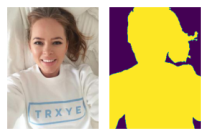

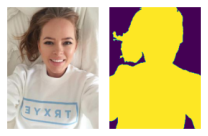

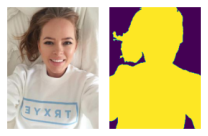

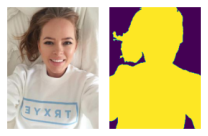

In [9]:
dataset = PhotosDataset(
    images_dir=os.path.join(DATA_PATH, 'train'),
    target_dir=os.path.join(DATA_PATH, 'train_mask'),
    transforms=[
        HorizontalFlip(p=0.5),
        
        ToTensor(),
        Normalize(
          mean=[0.485, 0.456, 0.406],
          std=[0.229, 0.224, 0.225]
        )
    ]
)

show_idx_image(dataset, 0)
show_idx_image(dataset, 0)
show_idx_image(dataset, 0)
show_idx_image(dataset, 0)

RandomCrop demonstration

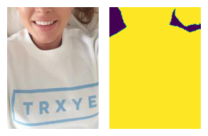

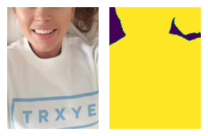

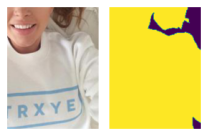

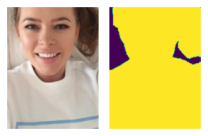

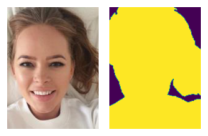

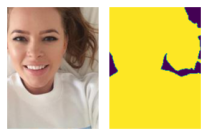

In [10]:
dataset = PhotosDataset(
    images_dir=os.path.join(DATA_PATH, 'train'),
    target_dir=os.path.join(DATA_PATH, 'train_mask'),
    transforms=[
        RandomCrop(size=(150, 200), p=1),
        
        ToTensor(),
        Normalize(
          mean=[0.485, 0.456, 0.406],
          std=[0.229, 0.224, 0.225]
        )
    ]
)

show_idx_image(dataset, 0)
show_idx_image(dataset, 0)
show_idx_image(dataset, 0)
show_idx_image(dataset, 0)
show_idx_image(dataset, 0)
show_idx_image(dataset, 0)

AdjustBrightness demonstation:

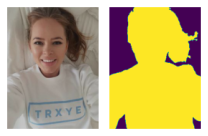

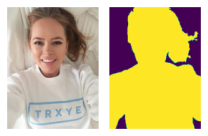

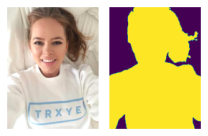

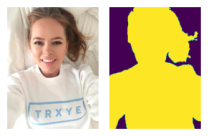

In [11]:
dataset = PhotosDataset(
    images_dir=os.path.join(DATA_PATH, 'train'),
    target_dir=os.path.join(DATA_PATH, 'train_mask'),
    transforms=[
        AdjustBrightness(p=1),
        
        ToTensor(),
        Normalize(
          mean=[0.485, 0.456, 0.406],
          std=[0.229, 0.224, 0.225]
        )
    ]
)

show_idx_image(dataset, 0)
show_idx_image(dataset, 0)
show_idx_image(dataset, 0)
show_idx_image(dataset, 0)

RandomBackground demonstation:

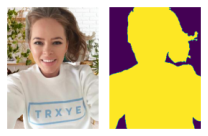

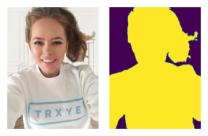

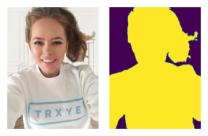

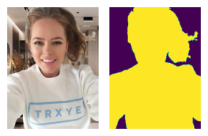

In [12]:
dataset = PhotosDataset(
    images_dir=os.path.join(DATA_PATH, 'train'),
    target_dir=os.path.join(DATA_PATH, 'train_mask'),
    transforms=[
        RandomBackground(p=1),
        
        ToTensor(),
        Normalize(
          mean=[0.485, 0.456, 0.406],
          std=[0.229, 0.224, 0.225]
        )
    ]
)

show_idx_image(dataset, 0)
show_idx_image(dataset, 0)
show_idx_image(dataset, 0)
show_idx_image(dataset, 0)

## `Загрузчики`

In [13]:
from data import PhotosDataset


train_dataset = PhotosDataset(
    images_dir=os.path.join(DATA_PATH, 'train'),
    target_dir=os.path.join(DATA_PATH, 'train_mask'),
    transforms=[
        HorizontalFlip(p=0.5),
        RandomCrop(size=(210, 280), p=0.2),
        AdjustBrightness(p=0.5),
        RandomBackground(p=0.25),
        
        ToTensor(),
        Normalize(
          mean=[0.485, 0.456, 0.406],
          std=[0.229, 0.224, 0.225]
        )
    ]
)

test_dataset = PhotosDataset(
    images_dir=os.path.join(DATA_PATH, 'test'),
    target_dir=os.path.join(DATA_PATH, 'test_mask'),
    transforms=[
        ToTensor(),
        Normalize(
          mean=[0.485, 0.456, 0.406],
          std=[0.229, 0.224, 0.225]
        )
    ]
)

In [14]:
test_loader = DataLoader(test_dataset, batch_size=8, num_workers=2)
train_loader = DataLoader(train_dataset, batch_size=8, num_workers=2, shuffle=True)

## DiceLoss

Результат **Dice Loss** определим как:

$$
\text{Dice Coefficient} = 2\frac{|A \cap B| }{|A| + |B|} \leadsto \text{Dice Loss} = 1 - \frac{2\sum\limits_{i, j}a_{ij}b_{ij}}{\sum\limits_{ij}(a_{ij} + b_{ij} + \varepsilon)}
$$

где $a_{ij} \in [0, 1]$ — предсказанная вероятность нахождения человека в пикселе изображения, $b_{ij}$ — истинная разметка для пикселя изображения.

In [15]:
from loss import DiceLoss

Проверка реализации:

In [16]:
logits = torch.tensor([
    [[0, 0.5], [0.5, 1]],
    [[0.1, 0.1], [0, 0]],
])

target = torch.tensor([
    [[0, 1], [1, 1]],
    [[1, 0], [0, 1]],
])

losses = DiceLoss(with_logits=False, reduction=None, eps=1e-7)(logits, target)
npt.assert_almost_equal(losses.numpy(), np.array([0.2, 0.90909]), decimal=4)

loss = DiceLoss(with_logits=False, reduction='mean', eps=1e-7)(logits, target)
npt.assert_almost_equal(float(loss.numpy()), 0.554545, decimal=4)

loss = DiceLoss(with_logits=False, reduction='sum', eps=1e-7)(logits, target)
npt.assert_almost_equal(float(loss.numpy()), 1.10909, decimal=4)

## U-Net

#### `Encoder`

In [17]:
from model import VGG13Encoder

In [18]:
assert sum((param.numel() for param in VGG13Encoder(num_blocks=1).parameters())) == 38720
assert sum((param.numel() for param in VGG13Encoder(num_blocks=2).parameters())) == 260160
model = VGG13Encoder(num_blocks=3)
assert sum((param.numel() for param in model.parameters())) == 1145408

x = torch.arange(1 * 3 * 320 * 240).reshape(1, 3, 320, 240) / (1 * 3 * 320 * 240)
out = model(x)

assert len(out) == 3
npt.assert_almost_equal(torch.linalg.norm(out[0]).item(), 902.218, decimal=3)
npt.assert_almost_equal(torch.linalg.norm(out[1]).item(), 571.030, decimal=3)
npt.assert_almost_equal(torch.linalg.norm(out[2]).item(), 648.068, decimal=3)
model

Downloading: "https://download.pytorch.org/models/vgg13-19584684.pth" to /root/.cache/torch/hub/checkpoints/vgg13-19584684.pth


  0%|          | 0.00/508M [00:00<?, ?B/s]

VGG13Encoder(
  (blocks): ModuleList(
    (0): Sequential(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (3): ReLU(inplace=True)
    )
    (1): Sequential(
      (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (3): ReLU(inplace=True)
    )
    (2): Sequential(
      (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (3): ReLU(inplace=True)
    )
  )
)

#### `Decoder`

#### `U-Net`

In [21]:
from model import UNet


model = UNet(num_classes=1, num_blocks=3)
x = torch.arange(1 * 3 * 320 * 240).reshape(1, 3, 320, 240) / (1 * 3 * 320 * 240)

assert sum((param.numel() for param in model.parameters())) == 2067649
assert list(model(x).shape) == [1, 1, 320, 240]
model

UNet(
  (encoder): VGG13Encoder(
    (blocks): ModuleList(
      (0): Sequential(
        (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): ReLU(inplace=True)
        (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (3): ReLU(inplace=True)
      )
      (1): Sequential(
        (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): ReLU(inplace=True)
        (2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (3): ReLU(inplace=True)
      )
      (2): Sequential(
        (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): ReLU(inplace=True)
        (2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (3): ReLU(inplace=True)
      )
    )
  )
  (decoder): Decoder(
    (blocks): ModuleList(
      (0): DecoderBlock(
        (upconv): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
       

### `Оценивание качества сети`

**IoU (Intersection over Union)** — один из стандартных вариантов для задачи сегментации:
$$
\text{IoU} = \frac{|A \cap B|}{|A \cup B|} = \frac{\sum\limits_{ij}a_{ij}b_{ij}}{\sum\limits_{ij}a_{ij} + b_{ij} - a_{ij}b_{ij}}
$$

In [22]:
from loss import IoUScore

In [23]:
logits = torch.tensor([
    [
        [0.3089,  0.4311, -0.9711],
        [0.9030,  1.0325, -0.7607],
        [0.9648, -0.5528, -1.1010]
    ], [
        [0.8906,  0.8099,  0.4458],
        [2.6215, -1.3198,  0.3142],
        [0.2262, -0.9175, -0.0174]
    ], [
        [0.8906,  0.8099,  0.4458],
        [2.6215, -1.3198,  0.3142],
        [0.2262, -0.9175, -0.0174]
    ]
])
true_labels = torch.tensor([
    [
        [0., 1., 0.],
        [1., 0., 0.],
        [0., 0., 1.]
    ], [
        [1., 1., 1.],
        [1., 0., 1.],
        [1., 0., 0.]
    ], [
        [1., 1., 1.],
        [0., 1., 1.],
        [1., 1., 1.]
    ]
])

scores = IoUScore()(logits, true_labels)
npt.assert_almost_equal(scores.numpy(), np.array([0.3333, 1.0000, 0.5556]), decimal=4)

score = IoUScore(reduction='sum')(logits, true_labels)
npt.assert_almost_equal(score.item(), 1.8889, decimal=4)

score = IoUScore(reduction='mean')(logits, true_labels)
npt.assert_almost_equal(score.item(), 0.6296, decimal=4)

### `Tensorboard и логирование`

Список того, что я логировал.

На каждой итерации (`train.Model.log_iter()`):
- лосс и метрика на трейне
- для каждого свёрточного слоя
    - нормы весов и смещений
    - нормы градиентов по весам и по смещениям

После каждой эпохи (`train.Model.log_epoch()`):
- лосс и метрика на тесте
- чекпоинт параметров всей модели
- для каждого свёрточного слоя
    - гистограмма весов и смещений
    - гистограммы градиентов по весам и смещениям
- фигура с демонстрацией работы модели на изображениях `Model.pics_to_log_demonstration`
    - изображение
    - карта предсказанных вероятностей
    - предсказанная маска
    - истинная маска
- для каждого из блоков энкодера и декодера логируются активации каждого изображения из `Model.pics_to_log_activations` (как grayscale изображения)
- для каждого из блоков энкодера и декодера логируются активации каждого изображения из `Model.pics_to_log_gradients` (как grayscale изображения)

В конце обучения (`train.Model.log_final_model()`):
- гиперпараметры модели
    - оптимизатор
    - оптимизируемый критерий
    - число эпох
- метрики
    - финальные лосс и метрика
    - лучшие метрика и номер эпохи
- графовая структура нейросети

При реализации цикла обучения необходимо сохранять метрики $1\text{-}9$ с использованием модуля [torch.utils.tensorboard](https://pytorch.org/docs/stable/tensorboard.html). Файлы с логами, а также чекпоинты весов модели после итерации с наилучшим валидационным качеством (смотрите [torch.save](https://pytorch.org/docs/stable/generated/torch.save.html) и [torch.nn.Module.state_dict](https://pytorch.org/tutorials/recipes/recipes/what_is_state_dict.html)) для **ВСЕХ** проведённых экспериментов (за исключением упавших, недосчитанных и так далее) необходимо сдать в anytask.

In [24]:
batch = next(iter(train_loader))

In [26]:
from torch.utils.tensorboard import SummaryWriter
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

### `Эксперименты`

#### Base

In [26]:
from train import Model


writer = SummaryWriter(filename_suffix='base')
model = Model(
    UNet(num_classes=1, num_blocks=3),
    test_loader, train_loader, writer=writer,
    pics_to_log_demonstration=batch,
    pics_to_log_activations=batch,
    pics_to_log_gradients=batch,
    criterion=torch.nn.BCEWithLogitsLoss(reduction='none'),
)
model.train(num_epoch=10)
writer.close()

Epoch 0: saved checkpoint to check-01-04-2023-20:37:49.pth
Epoch 1: saved checkpoint to check-01-04-2023-20:38:58.pth
Epoch 2: saved checkpoint to check-01-04-2023-20:40:10.pth
Epoch 3: saved checkpoint to check-01-04-2023-20:41:22.pth
Epoch 4: saved checkpoint to check-01-04-2023-20:42:35.pth
Epoch 5: saved checkpoint to check-01-04-2023-20:43:47.pth
Epoch 6: saved checkpoint to check-01-04-2023-20:44:59.pth
Epoch 7: saved checkpoint to check-01-04-2023-20:46:13.pth
Epoch 8: saved checkpoint to check-01-04-2023-20:47:25.pth
Epoch 9: saved checkpoint to check-01-04-2023-20:48:38.pth
Epoch 10: saved checkpoint to check-01-04-2023-20:49:49.pth


#### Continue with BCE

In [27]:
bce = UNet(num_classes=1, num_blocks=3)
bce.load_state_dict(torch.load('check-01-04-2023-20:49:49.pth'))

writer = SummaryWriter(filename_suffix='bce')
model = Model(
    bce,
    test_loader, train_loader, writer=writer,
    pics_to_log_demonstration=batch,
    pics_to_log_activations=batch,
    pics_to_log_gradients=batch,
    criterion=torch.nn.BCEWithLogitsLoss(reduction='none'),
)
model.train(num_epoch=20)
writer.close()

Epoch 0: saved checkpoint to check-01-04-2023-20:50:23.pth
Epoch 1: saved checkpoint to check-01-04-2023-20:51:34.pth
Epoch 2: saved checkpoint to check-01-04-2023-20:52:45.pth
Epoch 3: saved checkpoint to check-01-04-2023-20:53:58.pth
Epoch 4: saved checkpoint to check-01-04-2023-20:55:12.pth
Epoch 5: saved checkpoint to check-01-04-2023-20:56:23.pth
Epoch 6: saved checkpoint to check-01-04-2023-20:57:36.pth
Epoch 7: saved checkpoint to check-01-04-2023-20:58:49.pth
Epoch 8: saved checkpoint to check-01-04-2023-21:00:01.pth
Epoch 9: saved checkpoint to check-01-04-2023-21:01:13.pth
Epoch 10: saved checkpoint to check-01-04-2023-21:02:26.pth
Epoch 11: saved checkpoint to check-01-04-2023-21:03:38.pth
Epoch 12: saved checkpoint to check-01-04-2023-21:04:51.pth
Epoch 13: saved checkpoint to check-01-04-2023-21:06:03.pth
Epoch 14: saved checkpoint to check-01-04-2023-21:07:15.pth
Epoch 15: saved checkpoint to check-01-04-2023-21:08:28.pth
Epoch 16: saved checkpoint to check-01-04-2023-21:

In [28]:
! cp -n *.pth /content/drive/MyDrive/task_02
! cp -R runs /content/drive/MyDrive/task_02

#### Continue with Dice

In [29]:
dice = UNet(num_classes=1, num_blocks=3)
dice.load_state_dict(torch.load('check-01-04-2023-20:49:49.pth'))

writer = SummaryWriter(filename_suffix='dice')
model = Model(
    dice,
    test_loader, train_loader, writer=writer,
    pics_to_log_demonstration=batch,
    pics_to_log_activations=batch,
    pics_to_log_gradients=batch,
    criterion=DiceLoss()
)
model.train(num_epoch=20)
writer.close()

Epoch 0: saved checkpoint to check-01-04-2023-21:14:40.pth
Epoch 1: saved checkpoint to check-01-04-2023-21:15:48.pth
Epoch 2: saved checkpoint to check-01-04-2023-21:16:57.pth
Epoch 3: saved checkpoint to check-01-04-2023-21:18:08.pth
Epoch 4: saved checkpoint to check-01-04-2023-21:19:17.pth
Epoch 5: saved checkpoint to check-01-04-2023-21:20:27.pth
Epoch 6: saved checkpoint to check-01-04-2023-21:21:36.pth
Epoch 7: saved checkpoint to check-01-04-2023-21:22:46.pth
Epoch 8: saved checkpoint to check-01-04-2023-21:23:56.pth
Epoch 9: saved checkpoint to check-01-04-2023-21:25:04.pth
Epoch 10: saved checkpoint to check-01-04-2023-21:26:14.pth
Epoch 11: saved checkpoint to check-01-04-2023-21:27:24.pth
Epoch 12: saved checkpoint to check-01-04-2023-21:28:32.pth
Epoch 13: saved checkpoint to check-01-04-2023-21:29:42.pth
Epoch 14: saved checkpoint to check-01-04-2023-21:30:51.pth
Epoch 15: saved checkpoint to check-01-04-2023-21:32:00.pth
Epoch 16: saved checkpoint to check-01-04-2023-21:

In [30]:
! cp -n *.pth /content/drive/MyDrive/task_02
! cp -R runs /content/drive/MyDrive/task_02

#### Continue with $\alpha\cdot\text{Dice}+(1-\alpha)\cdot\text{BCE}$

##### $\alpha=0.25$

In [31]:
from loss import BCEDice

bcedice1 = UNet(num_classes=1, num_blocks=3)
bcedice1.load_state_dict(torch.load('check-01-04-2023-20:49:49.pth'))

writer = SummaryWriter(filename_suffix='bcedice1')
model = Model(
    bcedice1,
    test_loader, train_loader, writer=writer,
    pics_to_log_demonstration=batch,
    pics_to_log_activations=batch,
    pics_to_log_gradients=batch,
    criterion=BCEDice(alpha=0.25),
)
model.train(num_epoch=20)
writer.close()

Epoch 0: saved checkpoint to check-01-04-2023-21:38:00.pth
Epoch 1: saved checkpoint to check-01-04-2023-21:39:08.pth
Epoch 2: saved checkpoint to check-01-04-2023-21:40:19.pth
Epoch 3: saved checkpoint to check-01-04-2023-21:41:29.pth
Epoch 4: saved checkpoint to check-01-04-2023-21:42:41.pth
Epoch 5: saved checkpoint to check-01-04-2023-21:43:50.pth
Epoch 6: saved checkpoint to check-01-04-2023-21:45:01.pth
Epoch 7: saved checkpoint to check-01-04-2023-21:46:11.pth
Epoch 8: saved checkpoint to check-01-04-2023-21:47:21.pth
Epoch 9: saved checkpoint to check-01-04-2023-21:48:32.pth
Epoch 10: saved checkpoint to check-01-04-2023-21:49:42.pth
Epoch 11: saved checkpoint to check-01-04-2023-21:50:52.pth
Epoch 12: saved checkpoint to check-01-04-2023-21:52:03.pth
Epoch 13: saved checkpoint to check-01-04-2023-21:53:13.pth
Epoch 14: saved checkpoint to check-01-04-2023-21:54:22.pth
Epoch 15: saved checkpoint to check-01-04-2023-21:55:32.pth
Epoch 16: saved checkpoint to check-01-04-2023-21:

In [32]:
! cp -n *.pth /content/drive/MyDrive/task_02
! cp -R runs /content/drive/MyDrive/task_02

##### $\alpha=0.5$

In [33]:
bcedice2 = UNet(num_classes=1, num_blocks=3)
bcedice2.load_state_dict(torch.load('check-01-04-2023-20:49:49.pth'))

writer = SummaryWriter(filename_suffix='bcedice2')
model = Model(
    bcedice2,
    test_loader, train_loader, writer=writer,
    pics_to_log_demonstration=batch,
    pics_to_log_activations=batch,
    pics_to_log_gradients=batch,
    criterion=BCEDice(alpha=0.5),
)
model.train(num_epoch=20)
writer.close()

Epoch 0: saved checkpoint to check-01-04-2023-22:01:34.pth
Epoch 1: saved checkpoint to check-01-04-2023-22:02:46.pth
Epoch 2: saved checkpoint to check-01-04-2023-22:03:56.pth
Epoch 3: saved checkpoint to check-01-04-2023-22:05:05.pth
Epoch 4: saved checkpoint to check-01-04-2023-22:06:15.pth
Epoch 5: saved checkpoint to check-01-04-2023-22:07:24.pth
Epoch 6: saved checkpoint to check-01-04-2023-22:08:34.pth
Epoch 7: saved checkpoint to check-01-04-2023-22:09:43.pth
Epoch 8: saved checkpoint to check-01-04-2023-22:10:53.pth
Epoch 9: saved checkpoint to check-01-04-2023-22:12:03.pth
Epoch 10: saved checkpoint to check-01-04-2023-22:13:12.pth
Epoch 11: saved checkpoint to check-01-04-2023-22:14:22.pth
Epoch 12: saved checkpoint to check-01-04-2023-22:15:31.pth
Epoch 13: saved checkpoint to check-01-04-2023-22:16:40.pth
Epoch 14: saved checkpoint to check-01-04-2023-22:17:50.pth
Epoch 15: saved checkpoint to check-01-04-2023-22:18:59.pth
Epoch 16: saved checkpoint to check-01-04-2023-22:

In [34]:
! cp -n *.pth /content/drive/MyDrive/task_02
! cp -R runs /content/drive/MyDrive/task_02

##### $\alpha=0.75$

In [39]:
bcedice3 = UNet(num_classes=1, num_blocks=3)
bcedice3.load_state_dict(torch.load('check-01-04-2023-20:49:49.pth'))

writer = SummaryWriter(filename_suffix='bcedice3')
model = Model(
    bcedice3,
    test_loader, train_loader, writer=writer,
    pics_to_log_demonstration=batch,
    pics_to_log_activations=batch,
    pics_to_log_gradients=batch,
    criterion=BCEDice(alpha=0.75),
)
model.train(num_epoch=20)
writer.close()

Epoch 0: saved checkpoint to check-01-04-2023-22:46:19.pth
Epoch 1: saved checkpoint to check-01-04-2023-22:47:27.pth
Epoch 2: saved checkpoint to check-01-04-2023-22:48:36.pth
Epoch 3: saved checkpoint to check-01-04-2023-22:49:48.pth
Epoch 4: saved checkpoint to check-01-04-2023-22:50:58.pth
Epoch 5: saved checkpoint to check-01-04-2023-22:52:09.pth
Epoch 6: saved checkpoint to check-01-04-2023-22:53:19.pth
Epoch 7: saved checkpoint to check-01-04-2023-22:54:28.pth
Epoch 8: saved checkpoint to check-01-04-2023-22:55:38.pth
Epoch 9: saved checkpoint to check-01-04-2023-22:56:47.pth
Epoch 10: saved checkpoint to check-01-04-2023-22:57:56.pth
Epoch 11: saved checkpoint to check-01-04-2023-22:59:06.pth
Epoch 12: saved checkpoint to check-01-04-2023-23:00:16.pth
Epoch 13: saved checkpoint to check-01-04-2023-23:01:26.pth
Epoch 14: saved checkpoint to check-01-04-2023-23:02:35.pth
Epoch 15: saved checkpoint to check-01-04-2023-23:03:45.pth
Epoch 16: saved checkpoint to check-01-04-2023-23:

In [40]:
! cp -n *.pth /content/drive/MyDrive/task_02
! cp -R runs /content/drive/MyDrive/task_02

#### Visualization

In [37]:
! pip install -U tbparse

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [41]:
from tbparse import SummaryReader

bce = '/content/drive/MyDrive/task_02/runs/Apr01_20-50-16_91162232f431/events.out.tfevents.1680382216.91162232f431.420.2bce'
dice = '/content/drive/MyDrive/task_02/runs/Apr01_21-14-37_91162232f431/events.out.tfevents.1680383677.91162232f431.420.4dice'
bcedice1 = '/content/drive/MyDrive/task_02/runs/Apr01_21-37-57_91162232f431/events.out.tfevents.1680385077.91162232f431.420.6bcedice1'
bcedice2 = '/content/drive/MyDrive/task_02/runs/Apr01_22-01-31_91162232f431/events.out.tfevents.1680386491.91162232f431.420.8bcedice2'
bcedice3 = '/content/drive/MyDrive/task_02/runs/Apr01_22-46-16_91162232f431/events.out.tfevents.1680389176.91162232f431.420.14bcedice3'

bce = SummaryReader(bce, pivot=True)
dice = SummaryReader(dice, pivot=True)
bcedice1 = SummaryReader(bcedice1, pivot=True)
bcedice2 = SummaryReader(bcedice2, pivot=True)
bcedice3 = SummaryReader(bcedice3, pivot=True)

def sub_df(df, prefix):
  filter_col = [col for col in df if col.startswith(prefix)]
  return df[filter_col]

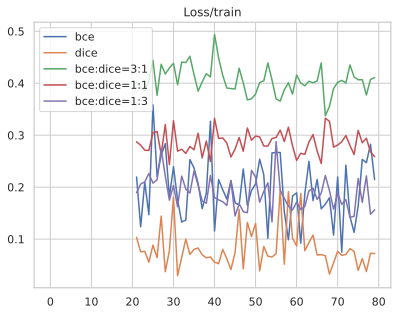

In [42]:
import seaborn as sns
sns.set(style='whitegrid')

def compare(prefix):
  plt.plot(sub_df(bce.scalars, prefix), label='bce')
  plt.plot(sub_df(dice.scalars, prefix), label='dice')
  plt.plot(sub_df(bcedice1.scalars, prefix), label='bce:dice=3:1')
  plt.plot(sub_df(bcedice2.scalars, prefix), label='bce:dice=1:1')
  plt.plot(sub_df(bcedice3.scalars, prefix), label='bce:dice=1:3')
  plt.legend()
  plt.title(prefix)
  plt.show()

compare('Loss/train')

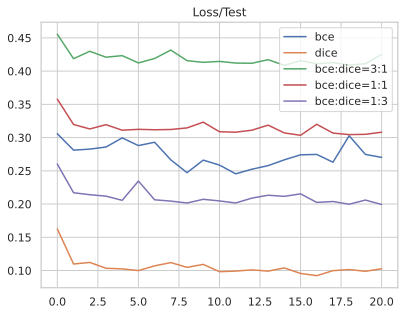

In [43]:
compare('Loss/Test')

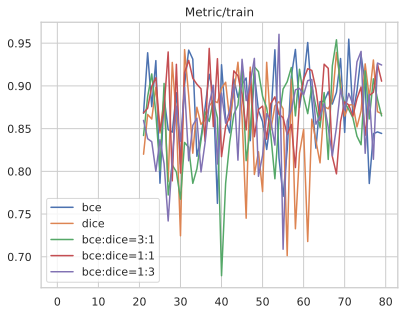

In [44]:
compare('Metric/train')

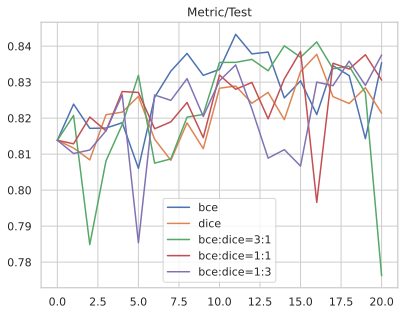

In [45]:
compare('Metric/Test')

Text(0.5, 1.0, 'BCE demonstration')

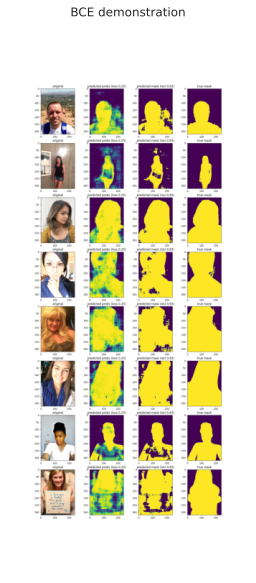

In [64]:
plt.figure(figsize=(5, 10))
plt.imshow(bce.images.loc[10, 'Demonstration'])
plt.axis('off')
plt.title('BCE demonstration')

Text(0.5, 1.0, 'Dice demonstration')

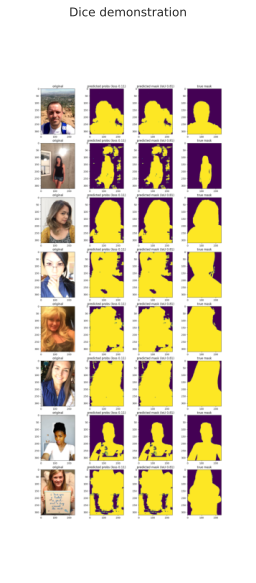

In [65]:
plt.figure(figsize=(5, 10))
plt.imshow(dice.images.loc[10, 'Demonstration'])
plt.axis('off')
plt.title('Dice demonstration')

Text(0.5, 1.0, 'bce_dice=3:1 demonstration')

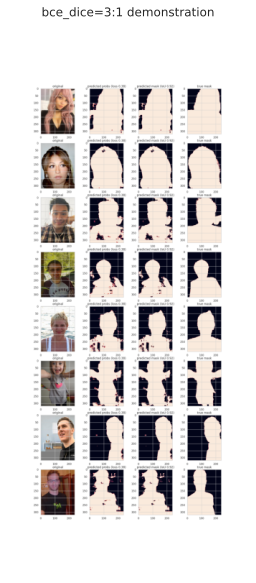

In [66]:
plt.figure(figsize=(5, 10))
plt.imshow(bcedice1.images.loc[10, 'Demonstration'])
plt.axis('off')
plt.title('bce_dice=3:1 demonstration')

Text(0.5, 1.0, 'bce_dice=1:1 demonstration')

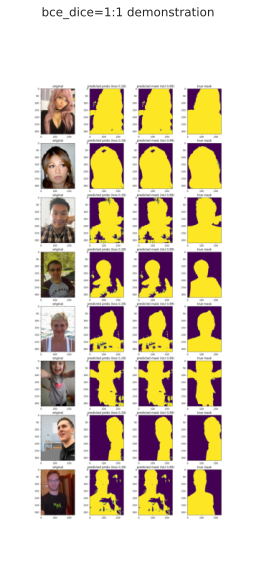

In [67]:
plt.figure(figsize=(5, 10))
plt.imshow(bcedice2.images.loc[10, 'Demonstration'])
plt.axis('off')
plt.title('bce_dice=1:1 demonstration')

Text(0.5, 1.0, 'bce_dice=1:3 demonstration')

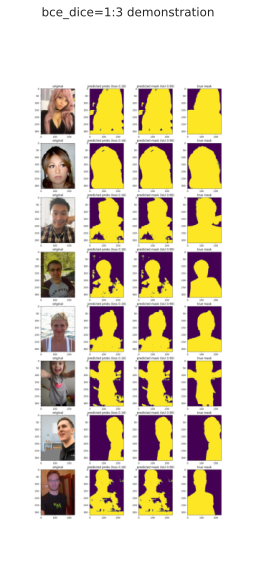

In [68]:
plt.figure(figsize=(5, 10))
plt.imshow(bcedice3.images.loc[10, 'Demonstration'])
plt.axis('off')
plt.title('bce_dice=1:3 demonstration')

#### Выводы

- Кросс-энтропийный лосс дает более высокое значение IoU, чем все остальные стратегии оптимизации
- Кросс-энтропийный лосс имеет больший масштаб, чем DiceLoss
- Больших различий между рассмотренными стратегиями не обнаружилось

## LinkNet

Реализуйте архитектуру [LinkNet](https://arxiv.org/pdf/1707.03718.pdf) с использованием энкодера, основанного на `VGG13`. Архитектура похожа на `Unet`, но вместо конкатенации слоёв используются skip-connections. Для реализации достаточно переписать структуру декодировщика из предыдущего пункта.

**Обучите сеть и проведите анализ согласно предыдущему пункту. Сравните LinkNet и U-Net по качеству и скорости работы. Сделайте выводы.**

#### Base

In [37]:
from model import LinkNet


writer = SummaryWriter(filename_suffix='base')
model = Model(
    LinkNet(num_classes=1, num_blocks=3),
    test_loader, train_loader, writer=writer,
    pics_to_log_demonstration=batch,
    pics_to_log_activations=batch,
    pics_to_log_gradients=batch,
    criterion=torch.nn.BCEWithLogitsLoss(reduction='none'),
)
model.train(num_epoch=10)
writer.close()

Epoch 0: saved checkpoint to check-01-04-2023-22:31:46.pth
Epoch 1: saved checkpoint to check-01-04-2023-22:32:50.pth
Epoch 2: saved checkpoint to check-01-04-2023-22:33:55.pth
Epoch 3: saved checkpoint to check-01-04-2023-22:34:59.pth
Epoch 4: saved checkpoint to check-01-04-2023-22:36:03.pth
Epoch 5: saved checkpoint to check-01-04-2023-22:37:07.pth
Epoch 6: saved checkpoint to check-01-04-2023-22:38:11.pth
Epoch 7: saved checkpoint to check-01-04-2023-22:39:15.pth
Epoch 8: saved checkpoint to check-01-04-2023-22:40:18.pth
Epoch 9: saved checkpoint to check-01-04-2023-22:41:23.pth
Epoch 10: saved checkpoint to check-01-04-2023-22:42:27.pth


In [ ]:
! cp -n *.pth /content/drive/MyDrive/task_02
! cp -R runs /content/drive/MyDrive/task_02

#### Continue with BCE

In [41]:
bce = LinkNet(num_classes=1, num_blocks=3)
bce.load_state_dict(torch.load('check-01-04-2023-22:42:27.pth'))

writer = SummaryWriter(filename_suffix='bce')
model = Model(
    bce,
    test_loader, train_loader, writer=writer,
    pics_to_log_demonstration=batch,
    pics_to_log_activations=batch,
    pics_to_log_gradients=batch,
    criterion=torch.nn.BCEWithLogitsLoss(reduction='none'),
)
model.train(num_epoch=20)
writer.close()

Epoch 0: saved checkpoint to check-01-04-2023-23:09:49.pth
Epoch 1: saved checkpoint to check-01-04-2023-23:10:53.pth
Epoch 2: saved checkpoint to check-01-04-2023-23:11:57.pth
Epoch 3: saved checkpoint to check-01-04-2023-23:13:02.pth
Epoch 4: saved checkpoint to check-01-04-2023-23:14:06.pth
Epoch 5: saved checkpoint to check-01-04-2023-23:15:10.pth
Epoch 6: saved checkpoint to check-01-04-2023-23:16:13.pth
Epoch 7: saved checkpoint to check-01-04-2023-23:17:17.pth
Epoch 8: saved checkpoint to check-01-04-2023-23:18:21.pth
Epoch 9: saved checkpoint to check-01-04-2023-23:19:25.pth
Epoch 10: saved checkpoint to check-01-04-2023-23:20:28.pth
Epoch 11: saved checkpoint to check-01-04-2023-23:21:33.pth
Epoch 12: saved checkpoint to check-01-04-2023-23:22:37.pth
Epoch 13: saved checkpoint to check-01-04-2023-23:23:42.pth
Epoch 14: saved checkpoint to check-01-04-2023-23:24:47.pth
Epoch 15: saved checkpoint to check-01-04-2023-23:25:51.pth
Epoch 16: saved checkpoint to check-01-04-2023-23:

In [42]:
! cp -n *.pth /content/drive/MyDrive/task_02
! cp -R runs /content/drive/MyDrive/task_02

#### Continue with Dice

In [43]:
dice = LinkNet(num_classes=1, num_blocks=3)
dice.load_state_dict(torch.load('check-01-04-2023-22:42:27.pth'))

writer = SummaryWriter(filename_suffix='dice')
model = Model(
    dice,
    test_loader, train_loader, writer=writer,
    pics_to_log_demonstration=batch,
    pics_to_log_activations=batch,
    pics_to_log_gradients=batch,
    criterion=DiceLoss()
)
model.train(num_epoch=20)
writer.close()

Epoch 0: saved checkpoint to check-01-04-2023-23:31:22.pth
Epoch 1: saved checkpoint to check-01-04-2023-23:32:27.pth
Epoch 2: saved checkpoint to check-01-04-2023-23:33:28.pth
Epoch 3: saved checkpoint to check-01-04-2023-23:34:29.pth
Epoch 4: saved checkpoint to check-01-04-2023-23:35:30.pth
Epoch 5: saved checkpoint to check-01-04-2023-23:36:32.pth
Epoch 6: saved checkpoint to check-01-04-2023-23:37:33.pth
Epoch 7: saved checkpoint to check-01-04-2023-23:38:34.pth
Epoch 8: saved checkpoint to check-01-04-2023-23:39:35.pth
Epoch 9: saved checkpoint to check-01-04-2023-23:40:37.pth
Epoch 10: saved checkpoint to check-01-04-2023-23:41:38.pth
Epoch 11: saved checkpoint to check-01-04-2023-23:42:40.pth
Epoch 12: saved checkpoint to check-01-04-2023-23:43:40.pth
Epoch 13: saved checkpoint to check-01-04-2023-23:44:41.pth
Epoch 14: saved checkpoint to check-01-04-2023-23:45:41.pth
Epoch 15: saved checkpoint to check-01-04-2023-23:46:43.pth
Epoch 16: saved checkpoint to check-01-04-2023-23:

In [44]:
! cp -n *.pth /content/drive/MyDrive/task_02
! cp -R runs /content/drive/MyDrive/task_02

#### Continue with $\alpha\cdot\text{Dice}+(1-\alpha)\cdot\text{BCE}$

##### $\alpha=0.25$

In [51]:
bcedice1 = LinkNet(num_classes=1, num_blocks=3)
bcedice1.load_state_dict(torch.load('check-01-04-2023-22:42:27.pth'))

writer = SummaryWriter(filename_suffix='bcedice1')
model = Model(
    bcedice1,
    test_loader, train_loader, writer=writer,
    pics_to_log_demonstration=batch,
    pics_to_log_activations=batch,
    pics_to_log_gradients=batch,
    criterion=BCEDice(alpha=0.25),
)
model.train(num_epoch=20)
writer.close()

Epoch 0: saved checkpoint to check-02-04-2023-08:37:01.pth
Epoch 1: saved checkpoint to check-02-04-2023-08:38:04.pth
Epoch 2: saved checkpoint to check-02-04-2023-08:39:08.pth
Epoch 3: saved checkpoint to check-02-04-2023-08:40:11.pth
Epoch 4: saved checkpoint to check-02-04-2023-08:41:15.pth
Epoch 5: saved checkpoint to check-02-04-2023-08:42:18.pth
Epoch 6: saved checkpoint to check-02-04-2023-08:43:23.pth
Epoch 7: saved checkpoint to check-02-04-2023-08:44:26.pth
Epoch 8: saved checkpoint to check-02-04-2023-08:45:28.pth
Epoch 9: saved checkpoint to check-02-04-2023-08:46:33.pth
Epoch 10: saved checkpoint to check-02-04-2023-08:47:35.pth
Epoch 11: saved checkpoint to check-02-04-2023-08:48:39.pth
Epoch 12: saved checkpoint to check-02-04-2023-08:49:42.pth
Epoch 13: saved checkpoint to check-02-04-2023-08:50:45.pth
Epoch 14: saved checkpoint to check-02-04-2023-08:51:47.pth
Epoch 15: saved checkpoint to check-02-04-2023-08:52:50.pth
Epoch 16: saved checkpoint to check-02-04-2023-08:

In [52]:
! cp -n *.pth /content/drive/MyDrive/task_02
! cp -R runs /content/drive/MyDrive/task_02

##### $\alpha=0.5$

In [32]:
bcedice2 = LinkNet(num_classes=1, num_blocks=3)
bcedice2.load_state_dict(torch.load('check-01-04-2023-22:42:27.pth'))

writer = SummaryWriter(filename_suffix='bcedice2')
model = Model(
    bcedice2,
    test_loader, train_loader, writer=writer,
    pics_to_log_demonstration=batch,
    pics_to_log_activations=batch,
    pics_to_log_gradients=batch,
    criterion=BCEDice(alpha=0.5),
)
model.train(num_epoch=20)
writer.close()

Epoch 0: saved checkpoint to check-02-04-2023-07:42:05.pth
Epoch 1: saved checkpoint to check-02-04-2023-07:43:04.pth
Epoch 2: saved checkpoint to check-02-04-2023-07:44:08.pth
Epoch 3: saved checkpoint to check-02-04-2023-07:45:09.pth
Epoch 4: saved checkpoint to check-02-04-2023-07:46:13.pth
Epoch 5: saved checkpoint to check-02-04-2023-07:47:15.pth
Epoch 6: saved checkpoint to check-02-04-2023-07:48:18.pth
Epoch 7: saved checkpoint to check-02-04-2023-07:49:20.pth
Epoch 8: saved checkpoint to check-02-04-2023-07:50:23.pth
Epoch 9: saved checkpoint to check-02-04-2023-07:51:25.pth
Epoch 10: saved checkpoint to check-02-04-2023-07:52:27.pth
Epoch 11: saved checkpoint to check-02-04-2023-07:53:29.pth
Epoch 12: saved checkpoint to check-02-04-2023-07:54:33.pth
Epoch 13: saved checkpoint to check-02-04-2023-07:55:35.pth
Epoch 14: saved checkpoint to check-02-04-2023-07:56:37.pth
Epoch 15: saved checkpoint to check-02-04-2023-07:57:40.pth
Epoch 16: saved checkpoint to check-02-04-2023-07:

In [33]:
! cp -n *.pth /content/drive/MyDrive/task_02
! cp -R runs /content/drive/MyDrive/task_02

##### $\alpha=0.75$

In [34]:
bcedice3 = LinkNet(num_classes=1, num_blocks=3)
bcedice3.load_state_dict(torch.load('check-01-04-2023-22:42:27.pth'))

writer = SummaryWriter(filename_suffix='bcedice3')
model = Model(
    bcedice3,
    test_loader, train_loader, writer=writer,
    pics_to_log_demonstration=batch,
    pics_to_log_activations=batch,
    pics_to_log_gradients=batch,
    criterion=BCEDice(alpha=0.75),
)
model.train(num_epoch=20)
writer.close()

Epoch 0: saved checkpoint to check-02-04-2023-08:03:04.pth
Epoch 1: saved checkpoint to check-02-04-2023-08:04:06.pth
Epoch 2: saved checkpoint to check-02-04-2023-08:05:08.pth
Epoch 3: saved checkpoint to check-02-04-2023-08:06:11.pth
Epoch 4: saved checkpoint to check-02-04-2023-08:07:13.pth
Epoch 5: saved checkpoint to check-02-04-2023-08:08:15.pth
Epoch 6: saved checkpoint to check-02-04-2023-08:09:18.pth
Epoch 7: saved checkpoint to check-02-04-2023-08:10:23.pth
Epoch 8: saved checkpoint to check-02-04-2023-08:11:25.pth
Epoch 9: saved checkpoint to check-02-04-2023-08:12:28.pth
Epoch 10: saved checkpoint to check-02-04-2023-08:13:30.pth
Epoch 11: saved checkpoint to check-02-04-2023-08:14:34.pth
Epoch 12: saved checkpoint to check-02-04-2023-08:15:35.pth
Epoch 13: saved checkpoint to check-02-04-2023-08:16:39.pth
Epoch 14: saved checkpoint to check-02-04-2023-08:17:40.pth
Epoch 15: saved checkpoint to check-02-04-2023-08:18:43.pth
Epoch 16: saved checkpoint to check-02-04-2023-08:

In [35]:
! cp -n *.pth /content/drive/MyDrive/task_02
! cp -R runs /content/drive/MyDrive/task_02

#### Visualization

In [53]:
bce = '/content/drive/MyDrive/task_02/runs/Apr01_23-09-44_91162232f431/events.out.tfevents.1680390584.91162232f431.420.16bce'
dice = '/content/drive/MyDrive/task_02/runs/Apr01_23-31-20_91162232f431/events.out.tfevents.1680391880.91162232f431.420.18dice'
bcedice1 = '/content/drive/MyDrive/task_02/runs/Apr02_08-36-58_d45c3c0fc6a6/events.out.tfevents.1680424618.d45c3c0fc6a6.420.5bcedice1'
bcedice2 = '/content/drive/MyDrive/task_02/runs/Apr02_07-41-57_d45c3c0fc6a6/events.out.tfevents.1680421317.d45c3c0fc6a6.420.1bcedice2'
bcedice3 = '/content/drive/MyDrive/task_02/runs/Apr02_08-03-01_d45c3c0fc6a6/events.out.tfevents.1680422581.d45c3c0fc6a6.420.3bcedice3'

bce = SummaryReader(bce, pivot=True)
dice = SummaryReader(dice, pivot=True)
bcedice1 = SummaryReader(bcedice1, pivot=True)
bcedice2 = SummaryReader(bcedice2, pivot=True)
bcedice3 = SummaryReader(bcedice3, pivot=True)

def sub_df(df, prefix):
  filter_col = [col for col in df if col.startswith(prefix)]
  return df[filter_col]

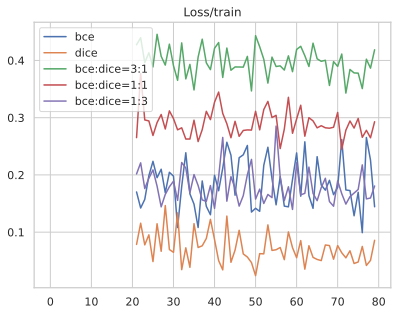

In [54]:
import seaborn as sns
sns.set(style='whitegrid')

def compare(prefix):
  plt.plot(sub_df(bce.scalars, prefix), label='bce')
  plt.plot(sub_df(dice.scalars, prefix), label='dice')
  plt.plot(sub_df(bcedice1.scalars, prefix), label='bce:dice=3:1')
  plt.plot(sub_df(bcedice2.scalars, prefix), label='bce:dice=1:1')
  plt.plot(sub_df(bcedice3.scalars, prefix), label='bce:dice=1:3')
  plt.legend()
  plt.title(prefix)
  plt.show()

compare('Loss/train')

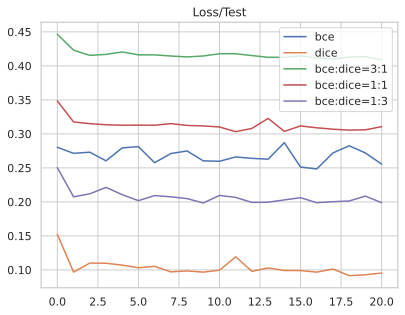

In [55]:
compare('Loss/Test')

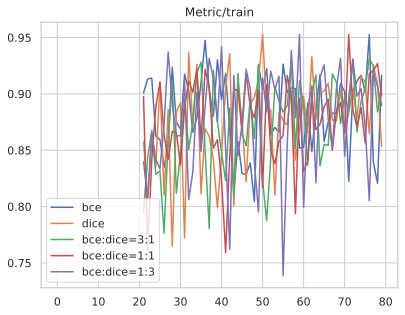

In [56]:
compare('Metric/train')

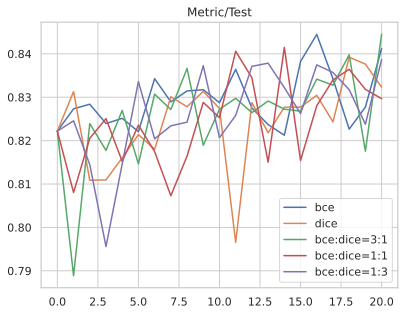

In [57]:
compare('Metric/Test')

Text(0.5, 1.0, 'BCE demonstration')

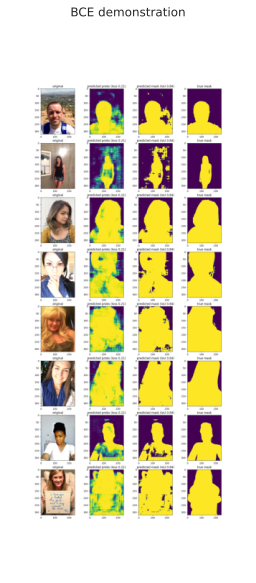

In [63]:
plt.figure(figsize=(5, 10))
plt.imshow(bce.images.loc[20, 'Demonstration'])
plt.axis('off')
plt.title('BCE demonstration')

Text(0.5, 1.0, 'Dice demonstration')

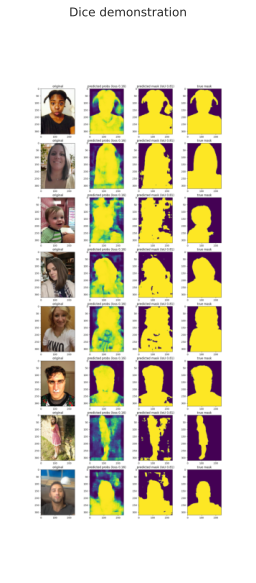

In [ ]:
plt.figure(figsize=(5, 10))
plt.imshow(dice.images.loc[0, 'Demonstration'])
plt.axis('off')
plt.title('Dice demonstration')

Text(0.5, 1.0, 'bce_dice=3:1 demonstration')

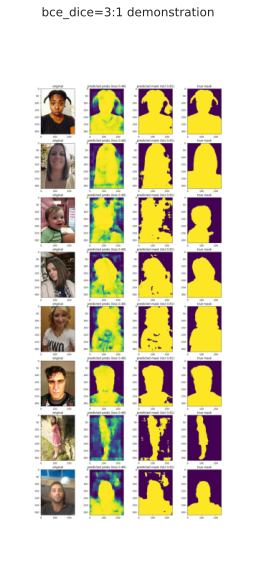

In [ ]:
plt.figure(figsize=(5, 10))
plt.imshow(bcedice1.images.loc[0, 'Demonstration'])
plt.axis('off')
plt.title('bce_dice=3:1 demonstration')

Text(0.5, 1.0, 'bce_dice=1:1 demonstration')

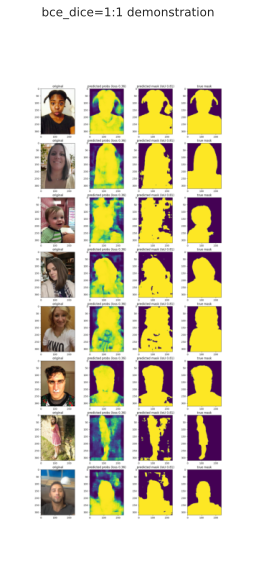

In [ ]:
plt.figure(figsize=(5, 10))
plt.imshow(bcedice2.images.loc[0, 'Demonstration'])
plt.axis('off')
plt.title('bce_dice=1:1 demonstration')

Text(0.5, 1.0, 'bce_dice=1:3 demonstration')

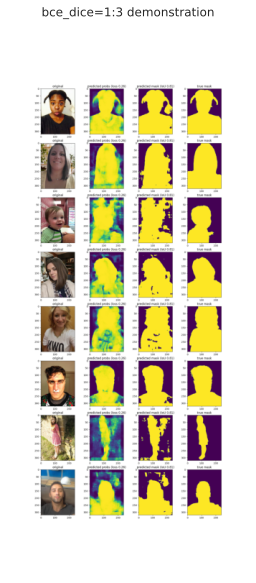

In [ ]:
plt.figure(figsize=(5, 10))
plt.imshow(bcedice3.images.loc[0, 'Demonstration'])
plt.axis('off')
plt.title('bce_dice=1:3 demonstration')

#### Выводы

- Для стратегий оптимизаций справедливы те же выводы, что и для UNet
- В сравнении с UNet качество на таком же уровне, но обучение происходит немного быстрее